Attaching SeuratObject


Attaching package: 'dplyr'


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union



Attaching package: 'cowplot'


The following object is masked from 'package:patchwork':

    align_plots


10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"


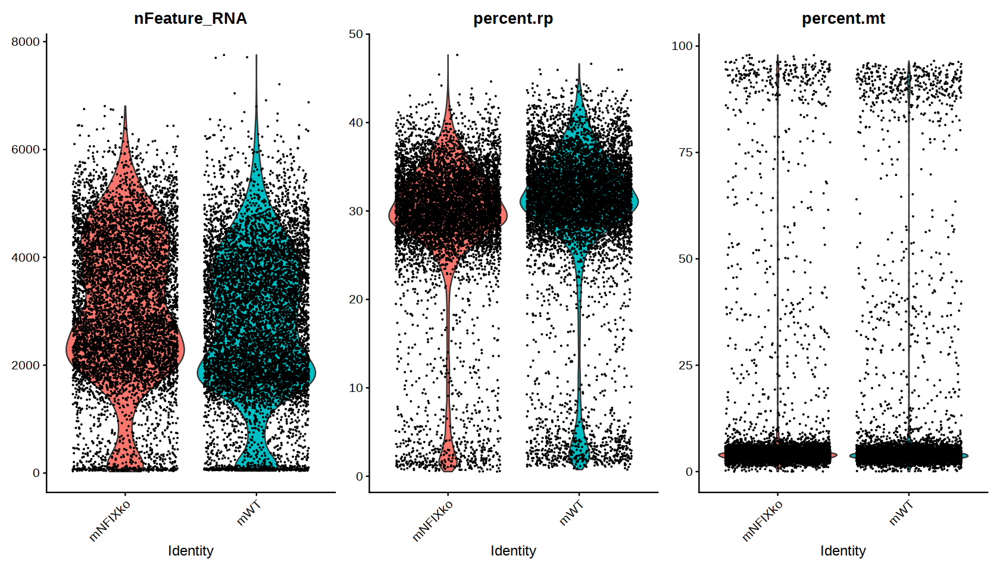

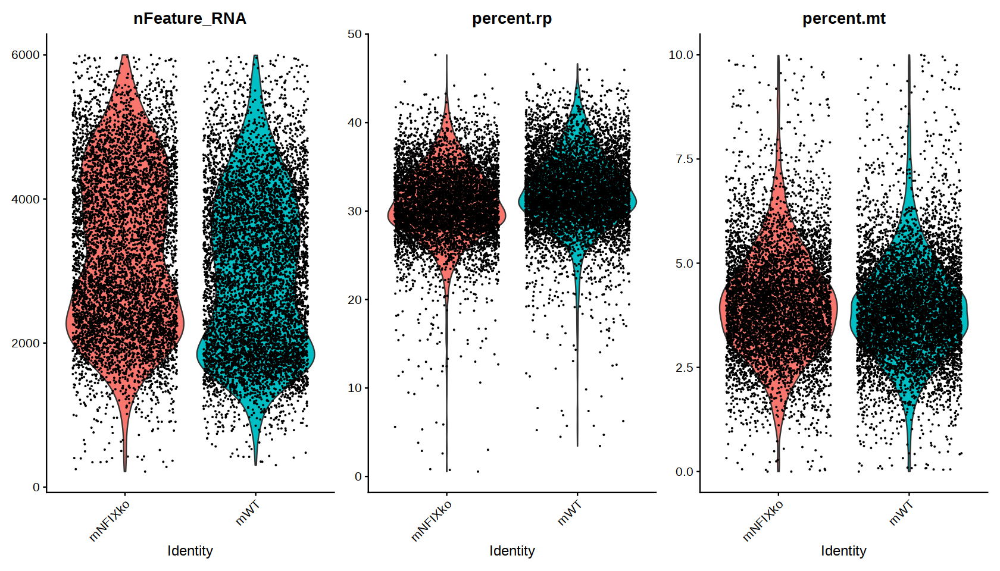

In [3]:
library(Seurat)

library(dplyr)
library(glue)
library(ggplot2)
library(patchwork)
library(cowplot)
library(stringr)
library(tidyr)
library("dplyr")

sample_id = c("mWT","mNFIXko")
myList = list()
for(i in 1:length(sample_id)){
    s=sample_id[i]
    dir = glue("{s}/outs/filtered_feature_bc_matrix")
    myData <- Read10X(data.dir = dir)
    myList[[i]]  <- CreateSeuratObject(counts = myData[["Gene Expression"]], min.cells = 0, min.features = 0,project = s, assay = "RNA")
    myList[[i]][["ADT"]] <- CreateAssayObject(myData[["Antibody Capture"]][, colnames(x = myList[[i]] )])

}
merged_obj = merge(myList[[1]], y = myList[[2]],add.cell.ids = sample_id)
merged_obj[["percent.mt"]] <- PercentageFeatureSet(merged_obj, pattern = "^mt-")
merged_obj[["percent.rp"]] <- PercentageFeatureSet(merged_obj, pattern = "^Rp[l|s]")
options(repr.plot.width = 14, repr.plot.height = 8)

VlnPlot(merged_obj, features = c("nFeature_RNA", "percent.rp", "percent.mt"), ncol = 3)

merged_obj <- subset(merged_obj, subset = nFeature_RNA >= 200 & nFeature_RNA <= 6000 & percent.mt <= 10 & nFeature_RNA <=50000)
VlnPlot(merged_obj, features = c("nFeature_RNA", "percent.rp", "percent.mt"), ncol = 3)


In [58]:
dim(merged_obj[["ADT"]])[1
                        ]

[1] 8

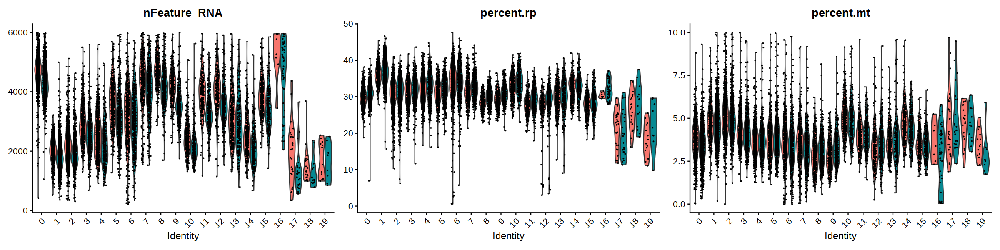

In [41]:
VlnPlot(merged_obj, features = c("nFeature_RNA", "percent.rp", "percent.mt"), ncol = 3,split.by="orig.ident")


In [1]:
merged_obj[["ADT"]]

ERROR: Error in eval(expr, envir, enclos): object 'merged_obj' not found


In [2]:
merged_obj <- SCTransform(merged_obj, vars.to.regress = "percent.rp", verbose = TRUE)


Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 16835 by 13949

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 90 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 16835 genes



  |======================================================================| 100%


Computing corrected count matrix for 16835 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 4.038983 mins

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.rp

Centering data matrix

Set default assay to SCT



In [3]:
merged_obj <- RunPCA(merged_obj, verbose = FALSE)


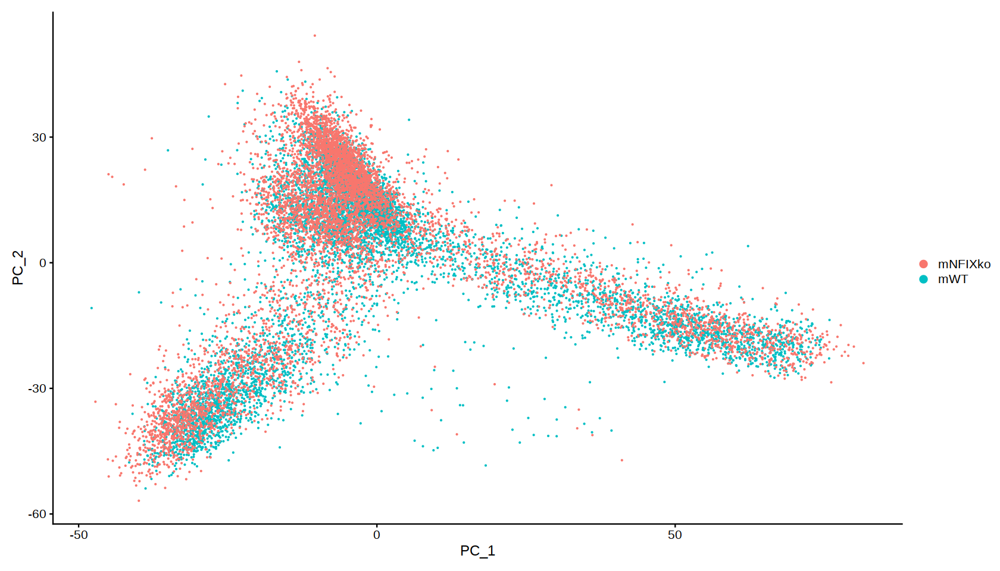

In [4]:
DimPlot(merged_obj,reduction="pca")

In [5]:
merged_obj <- RunUMAP(merged_obj, dims = 1:30, verbose = FALSE)


Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"


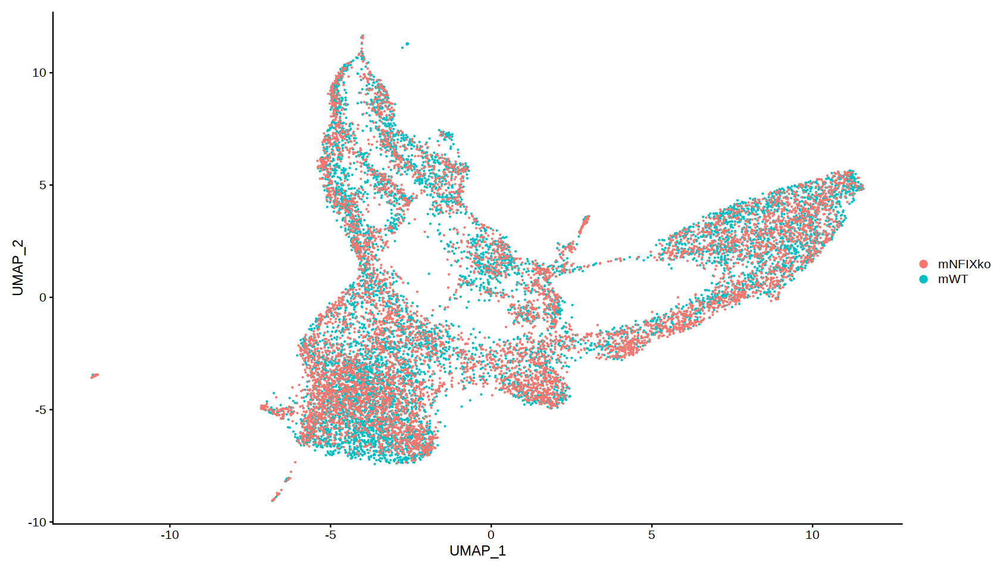

In [6]:
DimPlot(merged_obj,reduction="umap")

Warning message:
"Could not find Sca1-TotalA in the default search locations, found in ADT assay instead"
Warning message:
"Could not find CD150-TotalA in the default search locations, found in ADT assay instead"
Warning message:
"Could not find CD48-TotalA in the default search locations, found in ADT assay instead"
Warning message:
"Could not find CD16-32-TotalA in the default search locations, found in ADT assay instead"
Warning message:
"Could not find CD105-TotalA in the default search locations, found in ADT assay instead"
Warning message:
"Could not find CD41-TotalA in the default search locations, found in ADT assay instead"
Warning message:
"Could not find CD71-TotalA in the default search locations, found in ADT assay instead"
Warning message:
"Could not find CD34-TotalA in the default search locations, found in ADT assay instead"


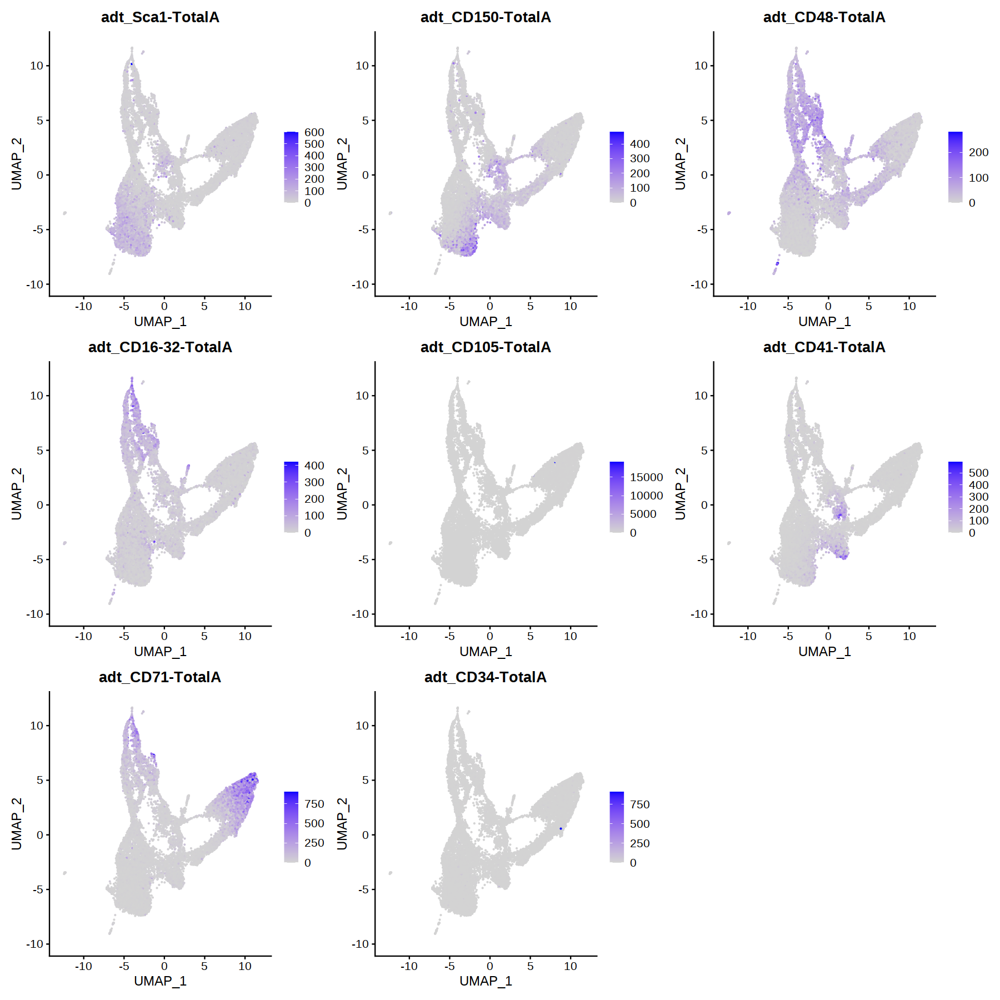

In [7]:
options(repr.plot.width = 15, repr.plot.height = 15)
FeaturePlot(merged_obj, features = rownames(merged_obj@assays$ADT@meta.features), reduction = 'umap')

In [8]:
DefaultAssay(merged_obj) <- 'ADT'
VariableFeatures(merged_obj) <- rownames(merged_obj[["ADT"]])
merged_obj <- NormalizeData(merged_obj, normalization.method = 'CLR', margin = 2) %>% 
  ScaleData()

Normalizing across cells

Centering and scaling data matrix



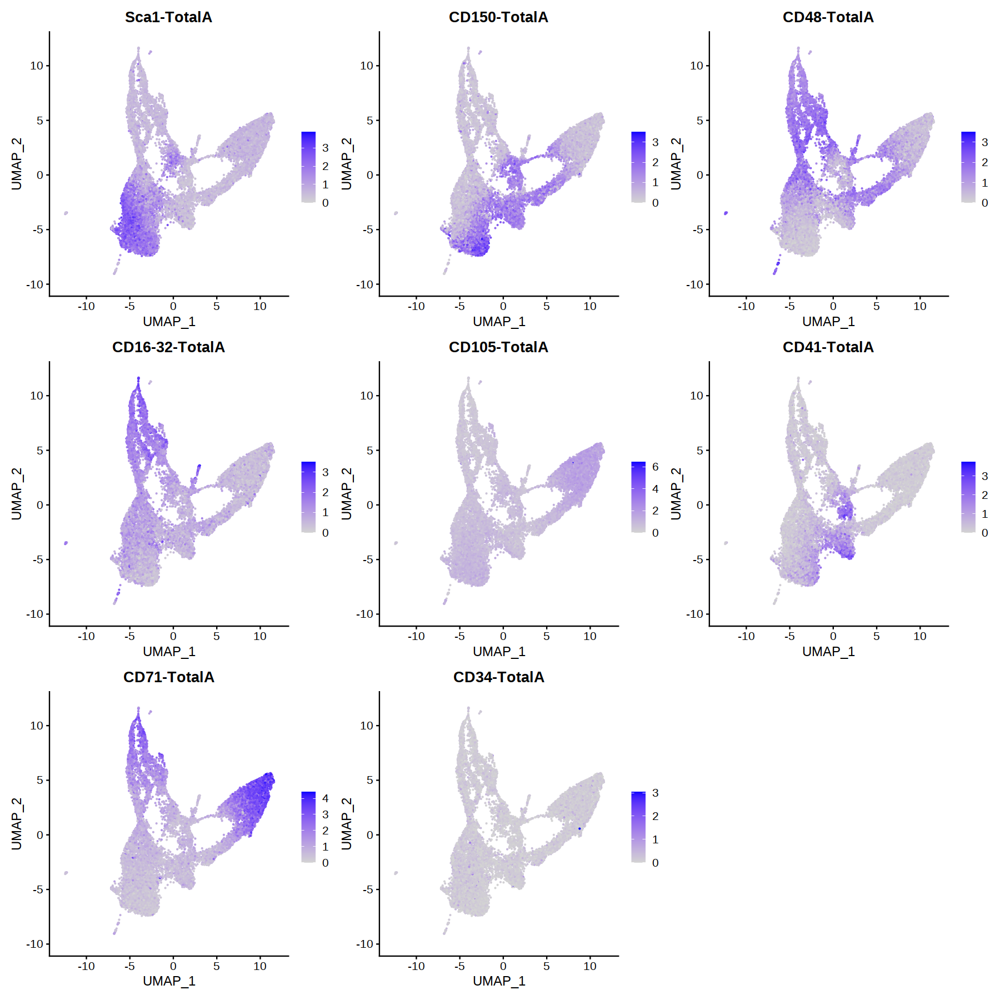

In [9]:
options(repr.plot.width = 15, repr.plot.height = 15)
FeaturePlot(merged_obj, features = rownames(merged_obj@assays$ADT@meta.features), reduction = 'umap')

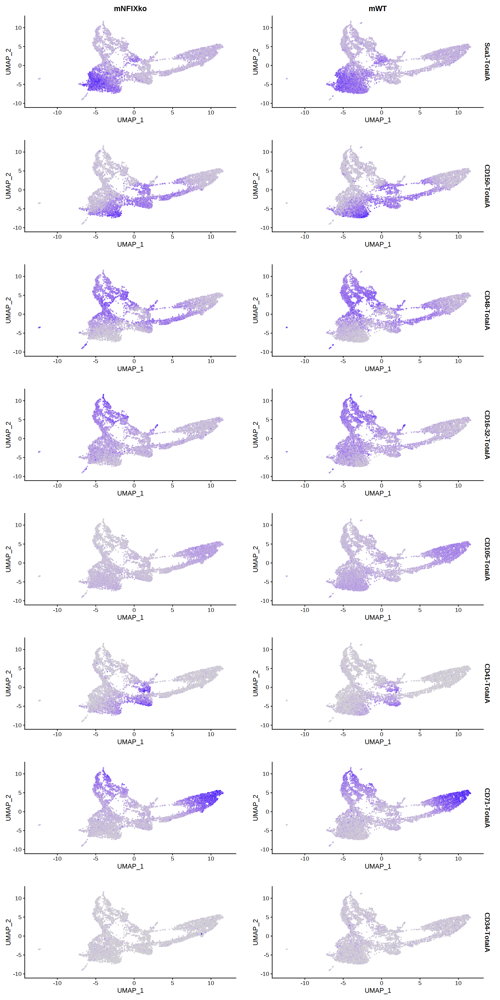

In [11]:
options(repr.plot.width = 15, repr.plot.height = 30)

FeaturePlot(merged_obj, features = rownames(merged_obj@assays$ADT@meta.features), reduction = 'umap',split.by="orig.ident")

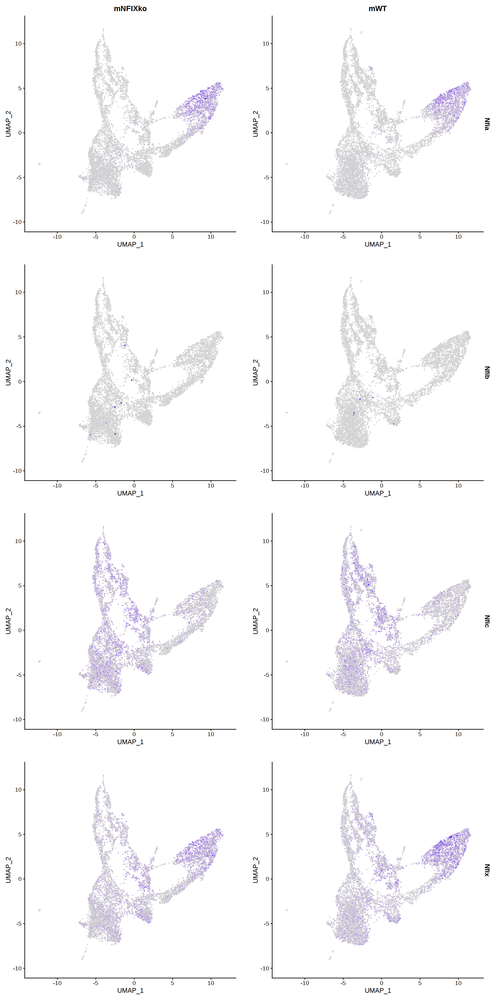

In [13]:
DefaultAssay(merged_obj) <- 'RNA'

FeaturePlot(merged_obj, features = c("Nfia","Nfib","Nfic","Nfix"), reduction = 'umap',ncol =4,split.by="orig.ident")

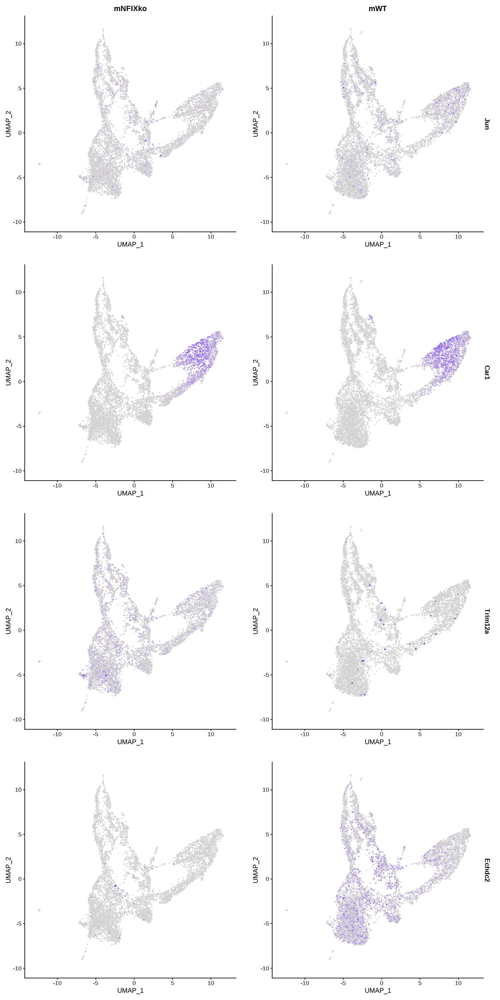

In [14]:
DefaultAssay(merged_obj) <- 'RNA'

FeaturePlot(merged_obj, features = c("Jun","Car1","Trim12a","Echdc2"), reduction = 'umap',ncol =4,split.by="orig.ident")

In [14]:
?FindNeighbors

FindNeighbors {Seurat},R Documentation
object,An object
...,Arguments passed to other methods
query,"Matrix of data to query against object. If missing, defaults to object."
distance.matrix,"Boolean value of whether the provided matrix is a distance matrix; note, for objects of class dist, this parameter will be set automatically"
k.param,Defines k for the k-nearest neighbor algorithm
return.neighbor,Return result as Neighbor object. Not used with distance matrix input.
compute.SNN,also compute the shared nearest neighbor graph
prune.SNN,"Sets the cutoff for acceptable Jaccard index when computing the neighborhood overlap for the SNN construction. Any edges with values less than or equal to this will be set to 0 and removed from the SNN graph. Essentially sets the stringency of pruning (0 — no pruning, 1 — prune everything)."
nn.method,"Method for nearest neighbor finding. Options include: rann, annoy"
n.trees,More trees gives higher precision when using annoy approximate nearest neighbor search


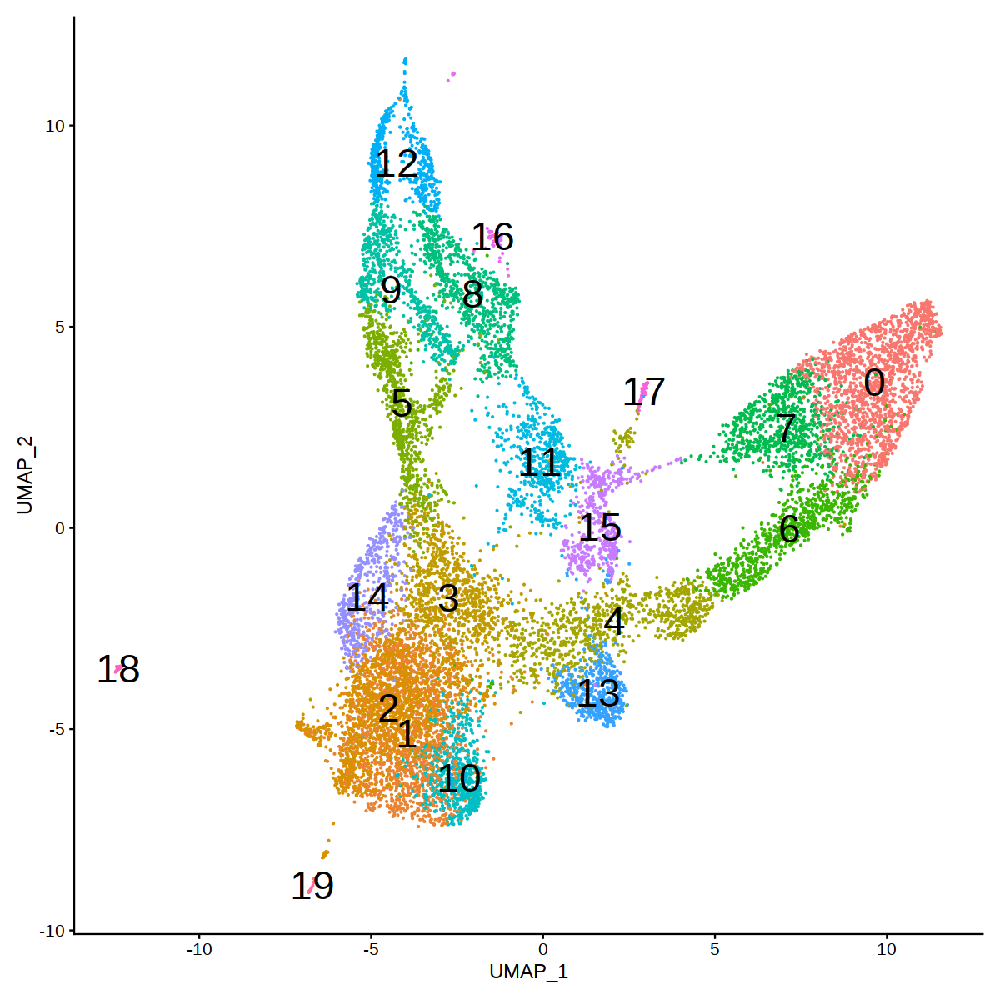

In [32]:
DefaultAssay(merged_obj) <- 'RNA'

merged_obj <- FindNeighbors(merged_obj,dims = 1:30, verbose = FALSE)
merged_obj <- FindClusters(merged_obj, verbose = FALSE,graph.name="SCT_snn")
options(repr.plot.width = 10, repr.plot.height = 10)

DimPlot(merged_obj, label = TRUE,label.size=10) + NoLegend()

In [33]:
cell_data <- merged_obj[[]]
head(cell_data)

,orig.ident,nCount_RNA,nFeature_RNA,nCount_ADT,nFeature_ADT,percent.mt,percent.rp,nCount_SCT,nFeature_SCT,SCT_snn_res.0.8,seurat_clusters
,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<int>,<fct>,<fct>
mWT_AAACCCAAGTGATCGG-1,mWT,3787,1690,103,7,5.307631,32.66438,8456,2010,1,1
mWT_AAACCCACAAACCATC-1,mWT,13420,3991,284,8,3.204173,34.01639,10343,3926,1,1
mWT_AAACCCACACTGTCCT-1,mWT,20299,4446,208,7,1.059165,30.07045,10364,3754,6,6
mWT_AAACCCACAGCCATTA-1,mWT,11463,3649,180,8,2.852656,31.04772,10144,3646,4,4
mWT_AAACCCAGTACCTAAC-1,mWT,22463,5146,414,8,3.770645,31.75444,10433,4003,11,11
mWT_AAACCCAGTCCTCCTA-1,mWT,28107,5085,196,8,1.946134,30.11349,10067,3451,7,7


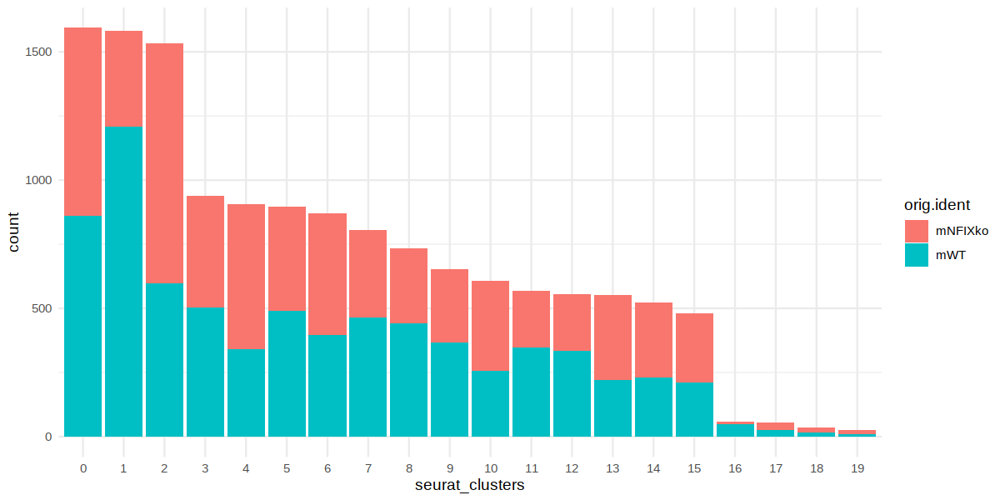

In [34]:
options(repr.plot.width = 10, repr.plot.height = 5)

a=ggplot(cell_data, aes(x = seurat_clusters, fill = orig.ident)) +
    geom_bar() +
    theme_minimal()
# custom_ggsave(a,outputDir,section_output$Clustering,"cluster_size_by_sample.pdf",10,5)
print (a)

`summarise()` has grouped output by 'seurat_clusters'. You can override using the `.groups` argument.



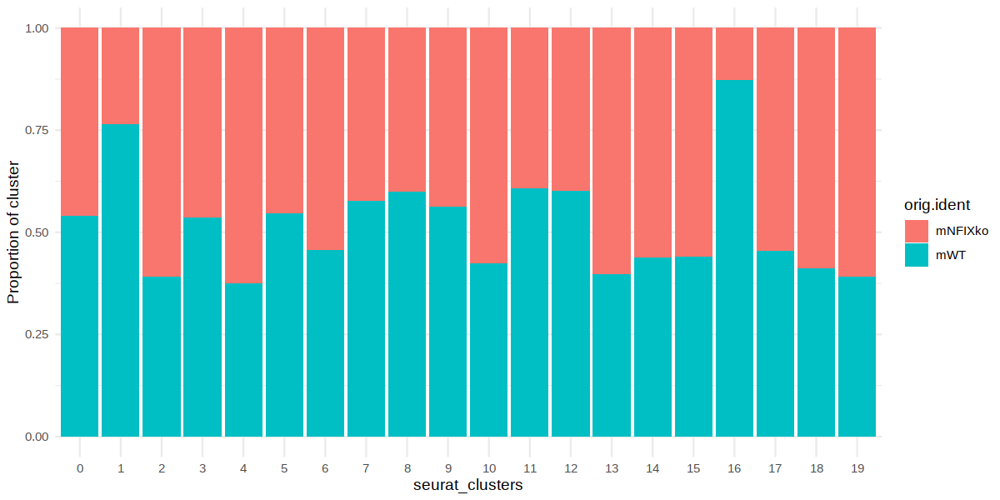

In [35]:
plot_data <- cell_data %>%
    group_by(seurat_clusters, orig.ident) %>%
    summarise(Count = n()) %>%
    mutate(Prop = Count / sum(Count))
a=ggplot(plot_data, aes(x = seurat_clusters, y = Prop, fill = orig.ident)) +
    geom_col() +
    ylab("Proportion of cluster") +
    theme_minimal()
# custom_ggsave(a,outputDir,section_output$Clustering,"cluster_size_proportion_by_sample.pdf",10,5)
print (a)

The default behaviour of split.by has changed.
Separate violin plots are now plotted side-by-side.
To restore the old behaviour of a single split violin,
set split.plot = TRUE.
      
This message will be shown once per session.



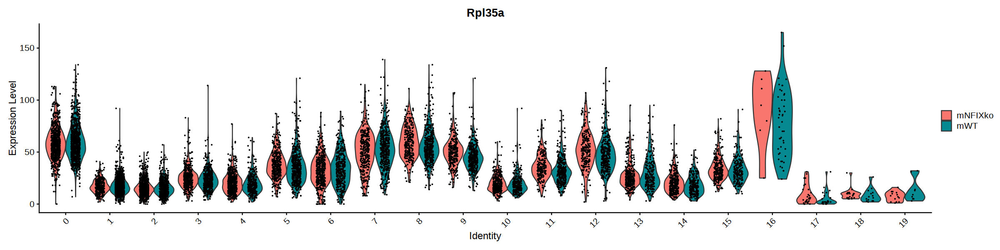

In [39]:
options(repr.plot.width = 20, repr.plot.height = 5)

VlnPlot(merged_obj, features = "Rpl35a",split.by="orig.ident",slot="data")

In [37]:
# helper functions
custom_ggsave = function(fig,rootDir,section_name,file_name,W,H){
    ggsave(paste0(rootDir,section_name,"/",file_name),plot=fig,
           height=as.integer(H),width=as.integer(W))
    
}
custom_write_table = function(var,rootDir,section_name,file_name,sep,row.names){
    write.table(var,file=paste0(rootDir,section_name,"/",file_name),sep=sep,row.names=row.names)
}
HVF_plot = function(obj){
    top30=head(VariableFeatures(obj), 30)
    plot1 <- VariableFeaturePlot(obj)
    plot2 <- LabelPoints(plot = plot1, points = top30, repel = TRUE)
    return (plot2)    
}
custom_write_table2 = function (var, rootDir, file_name, sep, row.names) 
{
    write.table(var, file = paste0(rootDir, 
        file_name), sep = sep, row.names = row.names)
}
custom_ggsave2 = function (fig, rootDir, file_name, W, H) 
{
    ggsave(paste0(rootDir, file_name), plot = fig, 
        height = as.integer(H), width = as.integer(W))
}

[1] "mWT"     "mNFIXko"
[1] "0"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



[1] "mWT"     "mNFIXko"
[1] "1"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



[1] "mWT"     "mNFIXko"
[1] "2"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



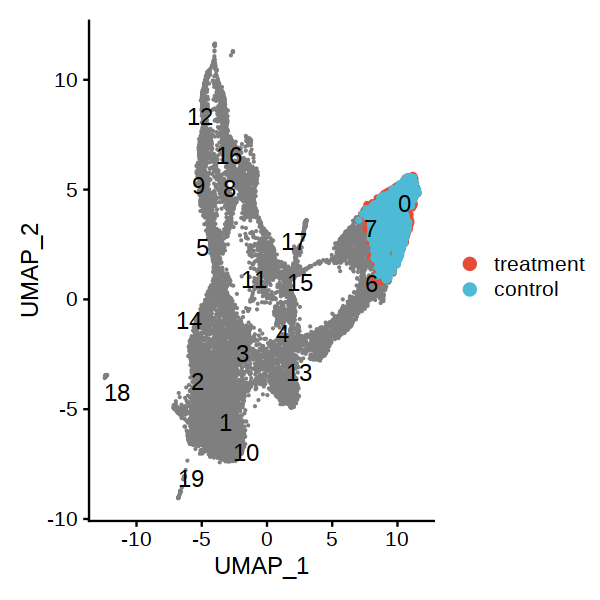

[1] "mWT"     "mNFIXko"
[1] "3"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



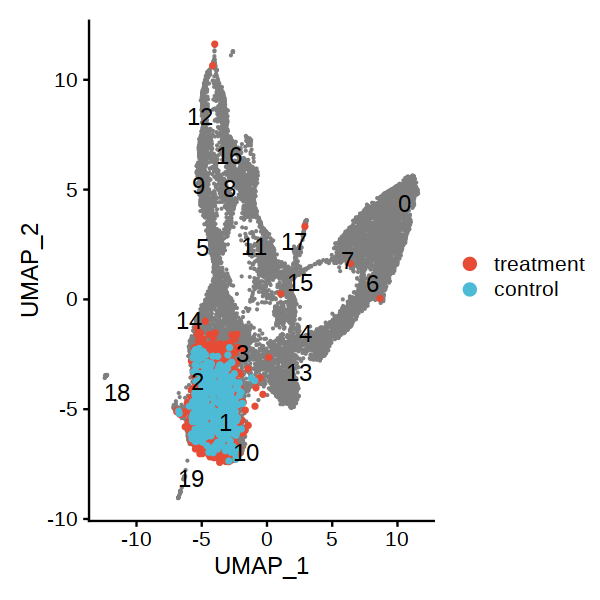

[1] "mWT"     "mNFIXko"
[1] "4"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



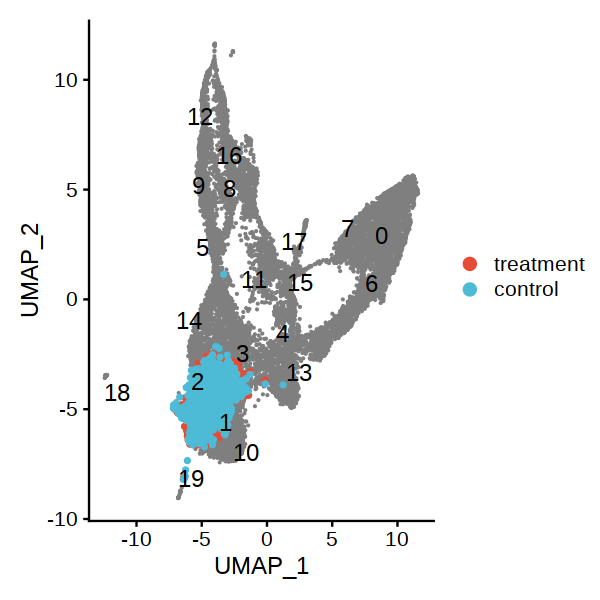

[1] "mWT"     "mNFIXko"
[1] "5"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



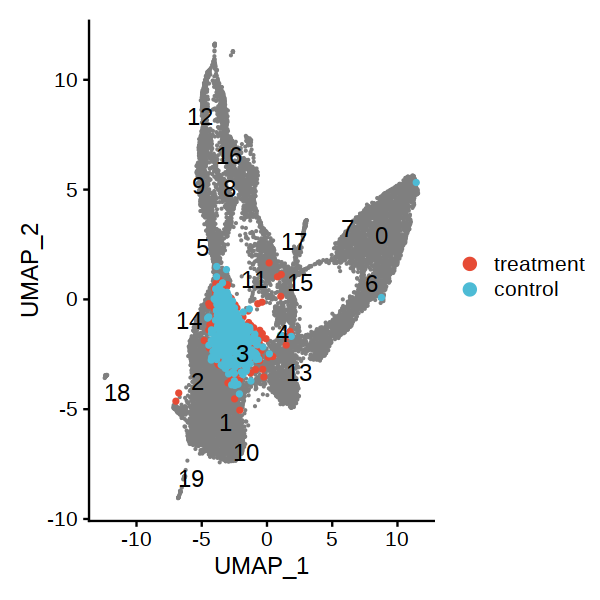

[1] "mWT"     "mNFIXko"
[1] "6"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



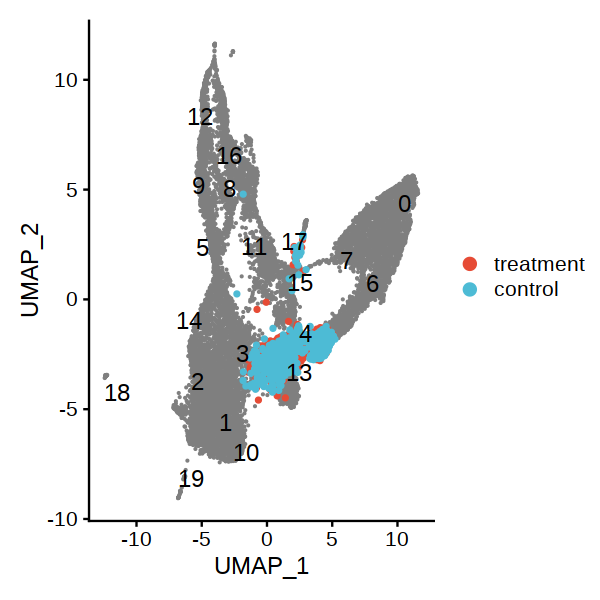

[1] "mWT"     "mNFIXko"
[1] "7"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



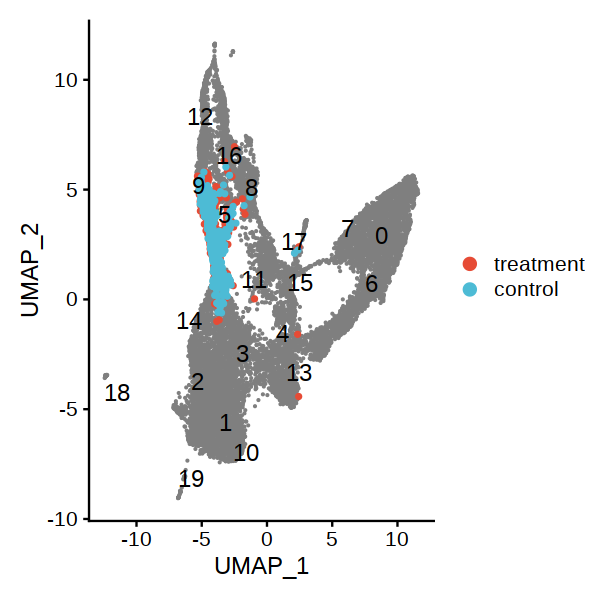

[1] "mWT"     "mNFIXko"
[1] "8"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



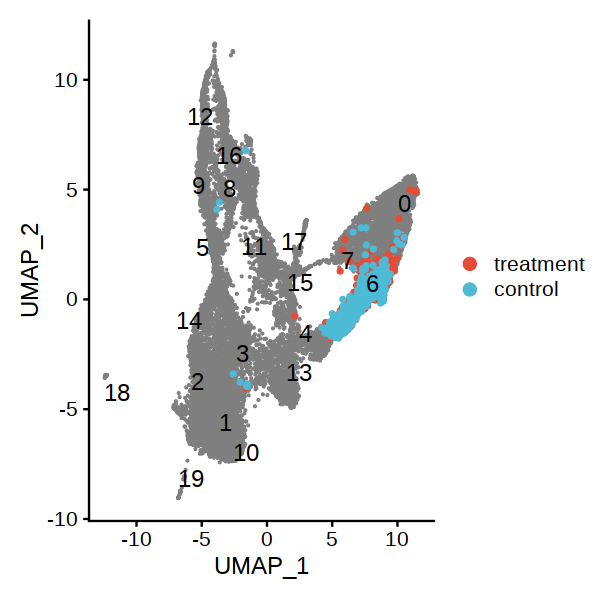

[1] "mWT"     "mNFIXko"
[1] "9"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



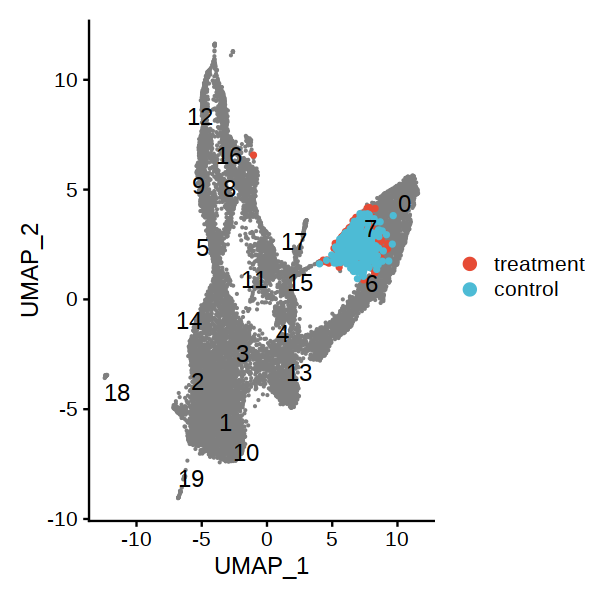

[1] "mWT"     "mNFIXko"
[1] "10"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



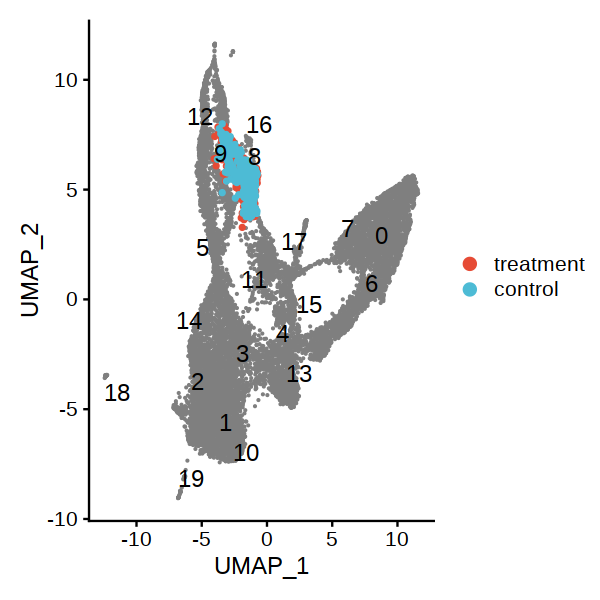

[1] "mWT"     "mNFIXko"
[1] "11"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



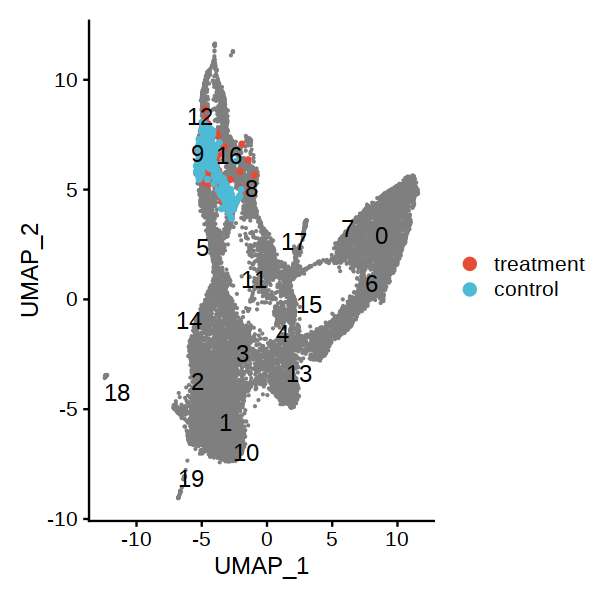

[1] "mWT"     "mNFIXko"
[1] "12"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



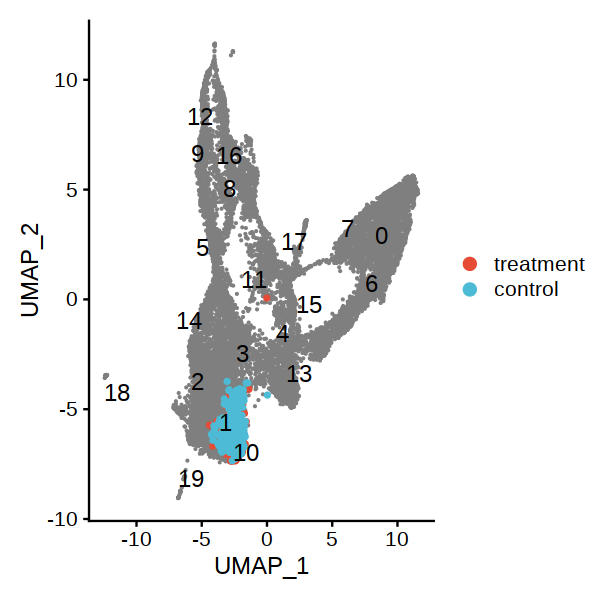

[1] "mWT"     "mNFIXko"
[1] "13"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



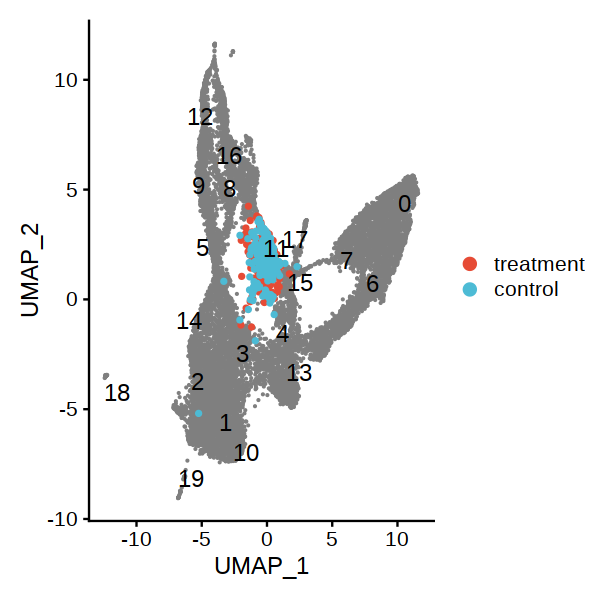

[1] "mWT"     "mNFIXko"
[1] "14"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



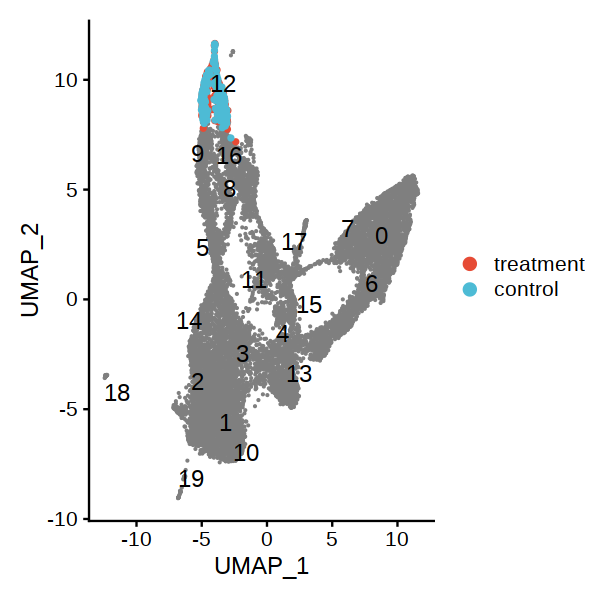

[1] "mWT"     "mNFIXko"
[1] "15"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



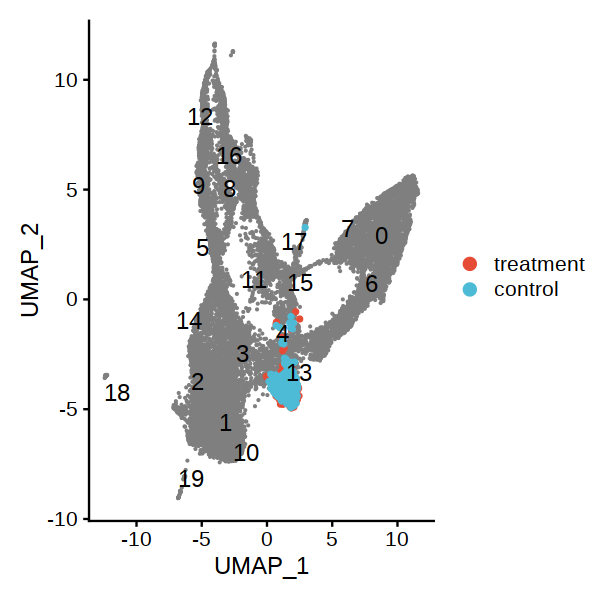

[1] "mWT"     "mNFIXko"
[1] "16"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



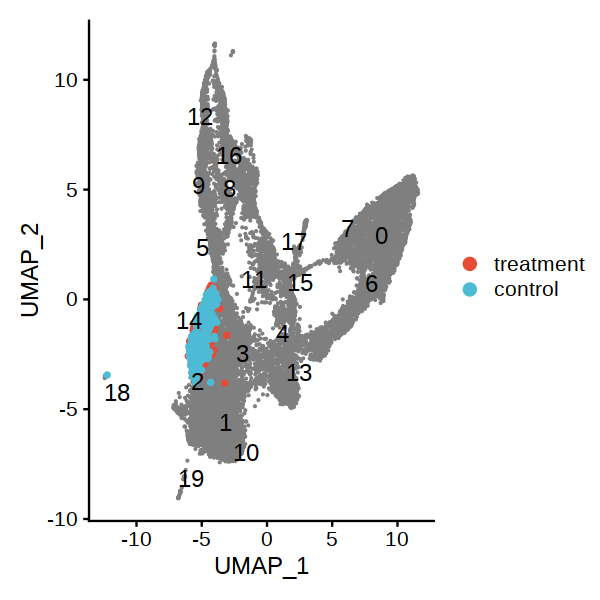

[1] "mWT"     "mNFIXko"
[1] "17"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



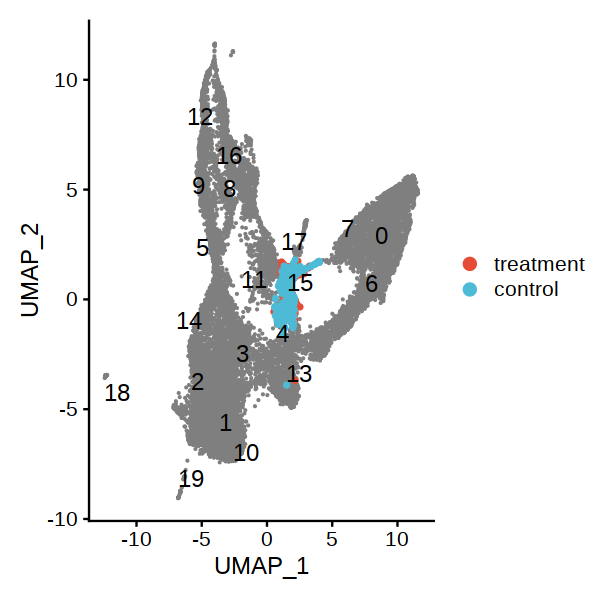

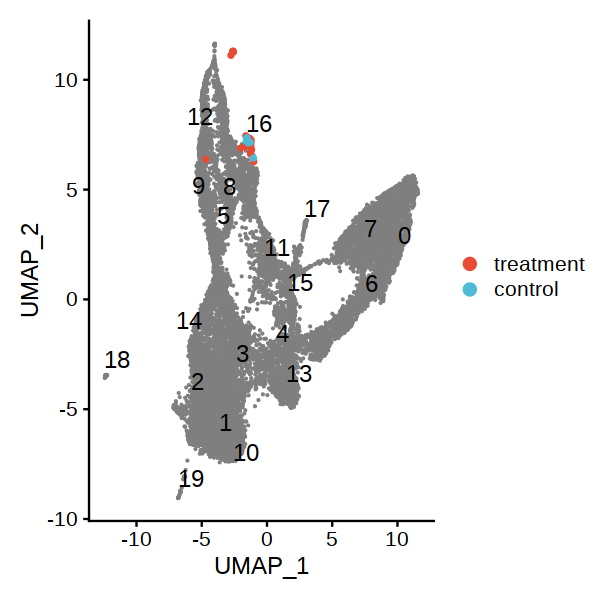

[1] "mWT"     "mNFIXko"
[1] "18"
[1] "mWT"     "mNFIXko"
[1] "19"


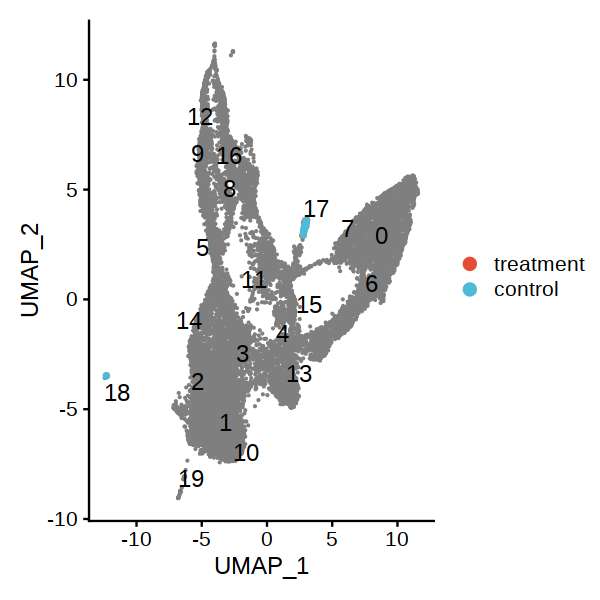

In [38]:
options(repr.plot.width = 5, repr.plot.height = 5)

pairwise_DEG = function(merged_obj,treatment,control,outDir){

for (c in levels(merged_obj)){
    tmp = subset(x = merged_obj, subset = seurat_clusters == c)
    degs = data.frame()
    tryCatch({
        print (unique(tmp$orig.ident))
        degs = FindMarkers(tmp, verbose=T,slot="data",ident.1 = treatment, ident.2 = control,group.by="orig.ident",logfc.threshold = 0.2,test.used="wilcox",pseudocount.use=1)                
    },error=function(cond){
        # message(cond)
        return (NA)
    },warning=function(cond){
        # message(cond)
        return (NA)
    },finally={
         
    }
    )
    # print (dim(degs))
    if (dim(degs)[1]==0){
        next
    }
    print (c)
    degs['fdr'] = p.adjust(degs$p_val, "BH")
    
    
    degs = degs[degs$fdr<=0.05,]
    custom_write_table2(degs,outDir,paste0("Cluster",c,".DEG.tsv"),sep="\t",row.names=T)
    if (dim(degs)[1]==0){next}
    # UMAP plot
    wt1 = WhichCells(merged_obj, expression = orig.ident == control & seurat_clusters==c)
    ko1 = WhichCells(merged_obj, expression = orig.ident == treatment & seurat_clusters==c)

    a=DimPlot(merged_obj,reduction = 'umap', label=T, cells.highlight= list(treatment=ko1, control=wt1), 
        cols.highlight = list("#E64B35","#4DBBD5"), cols= "grey100",repel = T, label.size = 5)+
        scale_colour_manual(values = c(treatment="#E64B35",control="#4DBBD5"))
    custom_ggsave2(a,outDir,paste0("Cluster",c,".UMAP.orig.ident.pdf"),10,10)
    print (a)
    # Vlnplot
    degs = head(degs,n=50)
    a=VlnPlot(tmp, features = rownames(degs),group.by="orig.ident",ncol=4,cols=c(treatment="#E64B35",control="#4DBBD5"))+ NoLegend()
    custom_ggsave2(a,outDir,paste0("Cluster",c,".Vln.orig.ident.pdf"),10,as.integer(length(degs)/4+1)*20)
    # print (a)
}    
    
}
pairwise_DEG(merged_obj,"mWT","mNFIXko","./")

# sctransform, norm individual then integrtation

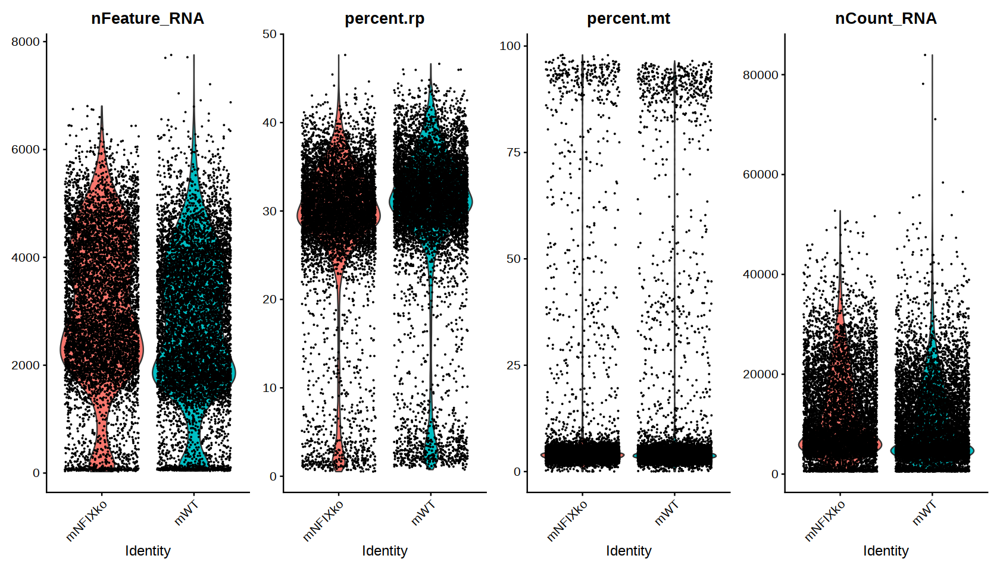

In [43]:
merged_obj = merge(myList[[1]], y = myList[[2]],add.cell.ids = sample_id)
merged_obj[["percent.mt"]] <- PercentageFeatureSet(merged_obj, pattern = "^mt-")
merged_obj[["percent.rp"]] <- PercentageFeatureSet(merged_obj, pattern = "^Rp[l|s]")
options(repr.plot.width = 14, repr.plot.height = 8)

VlnPlot(merged_obj, features = c("nFeature_RNA", "percent.rp", "percent.mt",'nCount_RNA'), ncol = 4)

In [44]:
ifnb.list <- SplitObject(merged_obj, split.by = "orig.ident")
ifnb.list <- lapply(X = ifnb.list, FUN = SCTransform)
features <- SelectIntegrationFeatures(object.list = ifnb.list, nfeatures = 3000)
ifnb.list <- PrepSCTIntegration(object.list = ifnb.list, anchor.features = features)

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 15710 by 8116

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 112 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 15710 genes



  |======================================================================| 100%


Computing corrected count matrix for 15710 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.592686 mins

Determine variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 15884 by 7214

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 110 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 15884 genes



  |======================================================================| 100%


Computing corrected count matrix for 15884 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.560331 mins

Determine variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT



In [45]:
immune.anchors <- FindIntegrationAnchors(object.list = ifnb.list, normalization.method = "SCT",
    anchor.features = features)
immune.combined.sct <- IntegrateData(anchorset = immune.anchors, normalization.method = "SCT")

Finding all pairwise anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 19212 anchors

Filtering anchors

	Retained 17174 anchors

Merging dataset 2 into 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data



In [46]:
immune.combined.sct <- RunPCA(immune.combined.sct, verbose = FALSE)
immune.combined.sct <- RunUMAP(immune.combined.sct, reduction = "pca", dims = 1:30)
p1 <- DimPlot(immune.combined.sct, reduction = "umap", group.by = "orig.ident")
p2 <- DimPlot(immune.combined.sct, reduction = "umap", group.by = "seurat_annotations", label = TRUE,
    repel = TRUE)
p1 + p2

16:21:47 UMAP embedding parameters a = 0.9922 b = 1.112

16:21:47 Read 15330 rows and found 30 numeric columns

16:21:47 Using Annoy for neighbor search, n_neighbors = 30

16:21:47 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:21:48 Writing NN index file to temp file /lsf_tmp/148375513_1.tmpdir/Rtmpdco9Ql/fileab5d7fa2dcbc

16:21:48 Searching Annoy index using 1 thread, search_k = 3000

16:21:53 Annoy recall = 100%

16:21:54 Commencing smooth kNN distance calibration using 1 thread

16:21:55 Initializing from normalized Laplacian + noise

16:21:55 Commencing optimization for 200 epochs, with 641964 positive edges

16:22:12 Optimization finished



ERROR: Error: Cannot find 'seurat_annotations' in this Seurat object


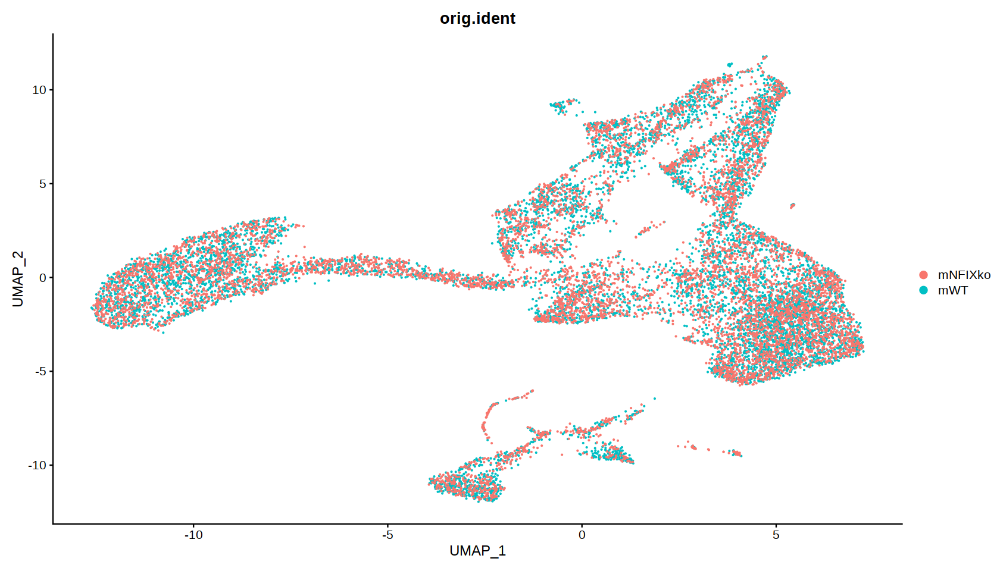

In [47]:
DimPlot(immune.combined.sct, reduction = "umap", group.by = "orig.ident")

In [48]:
immune.combined.sct <- FindNeighbors(immune.combined.sct, reduction = "pca", dims = 1:30)
immune.combined.sct <- FindClusters(immune.combined.sct)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 15330
Number of edges: 550916

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8854
Number of communities: 21
Elapsed time: 1 seconds


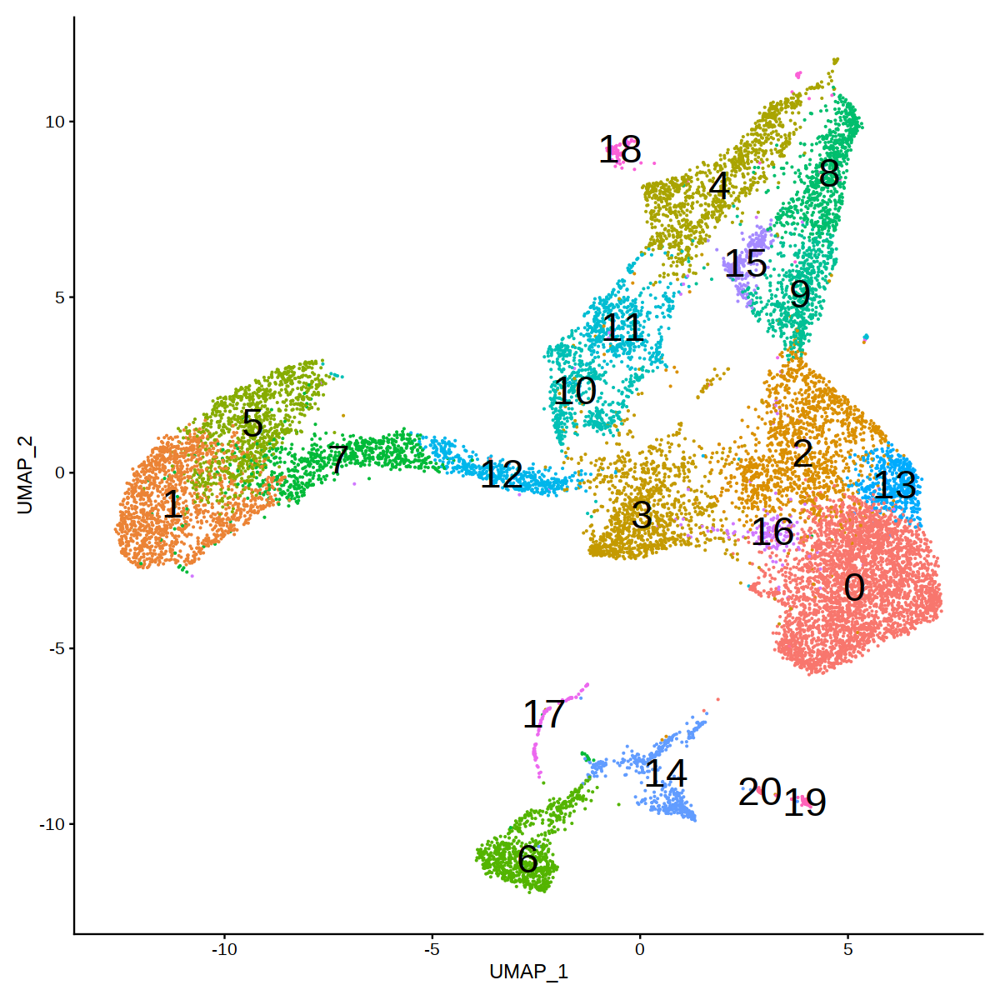

In [49]:
options(repr.plot.width = 10, repr.plot.height = 10)

DimPlot(immune.combined.sct, label = TRUE,label.size=10) + NoLegend()

[1] "mWT"     "mNFIXko"
[1] "0"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



[1] "mWT"     "mNFIXko"
[1] "1"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



[1] "mWT"     "mNFIXko"
[1] "2"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



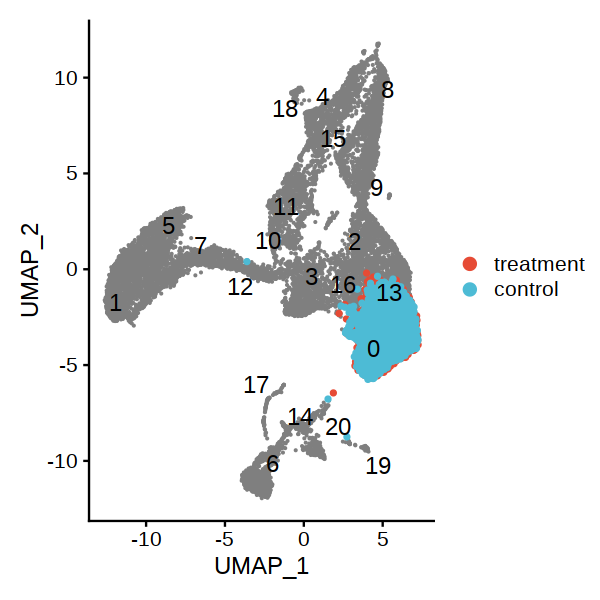

[1] "mWT"     "mNFIXko"
[1] "3"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



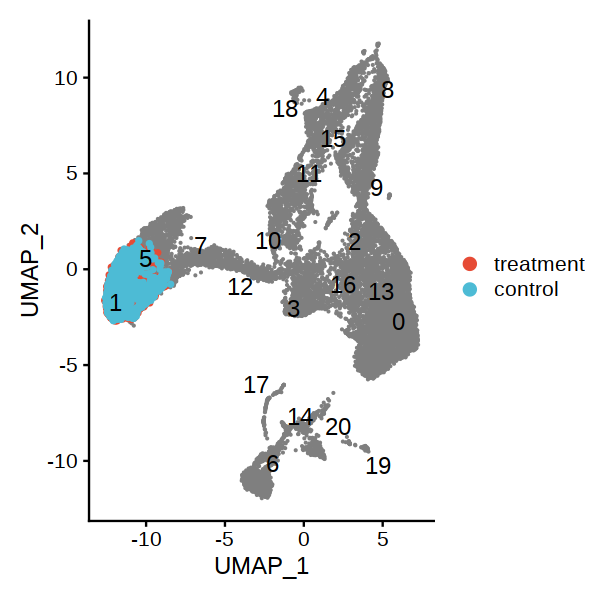

[1] "mWT"     "mNFIXko"
[1] "4"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



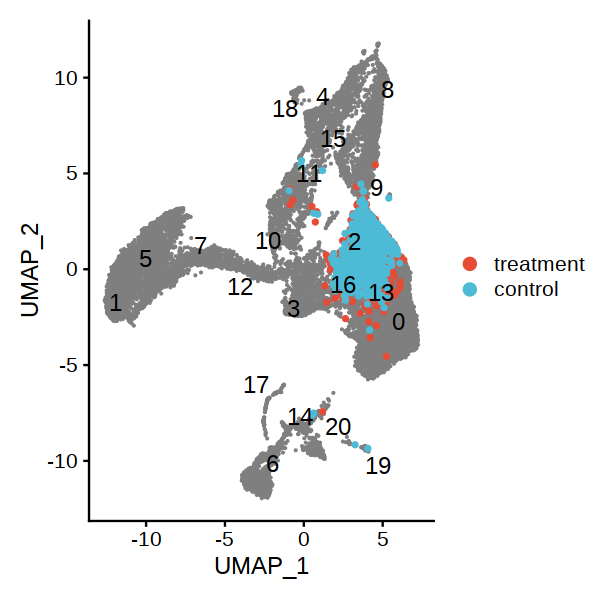

[1] "mWT"     "mNFIXko"
[1] "5"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



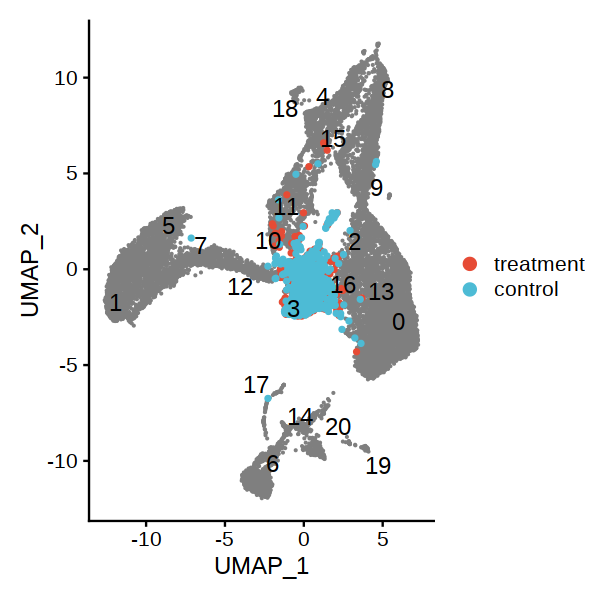

[1] "mWT"     "mNFIXko"
[1] "6"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



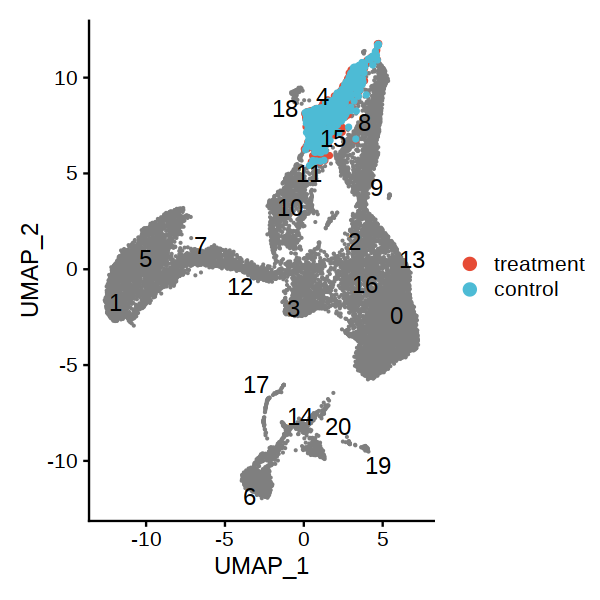

[1] "mWT"     "mNFIXko"
[1] "7"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



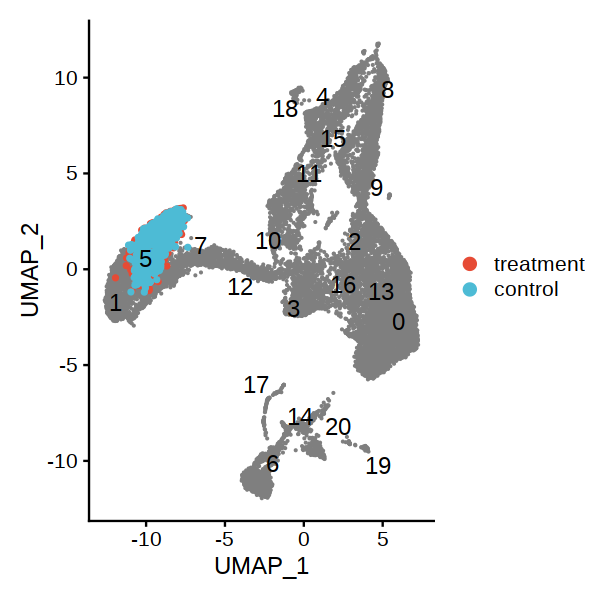

[1] "mWT"     "mNFIXko"
[1] "8"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



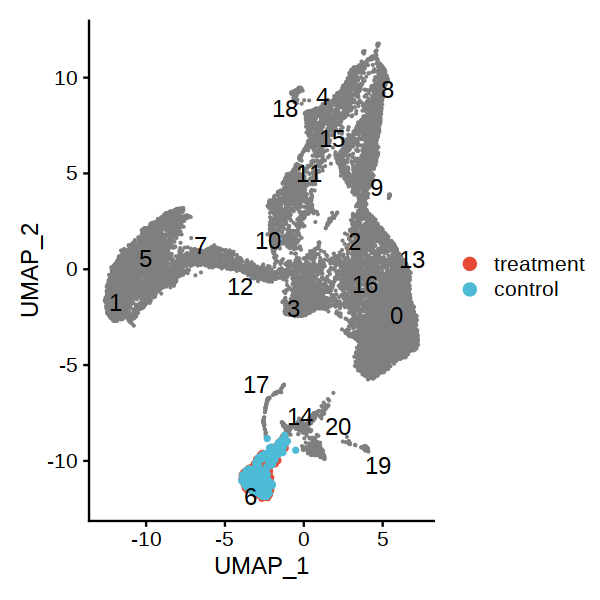

[1] "mWT"     "mNFIXko"
[1] "9"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



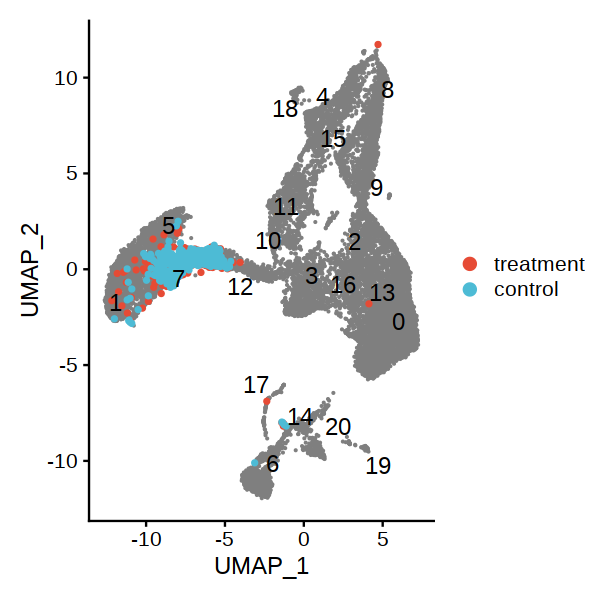

[1] "mWT"     "mNFIXko"
[1] "10"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



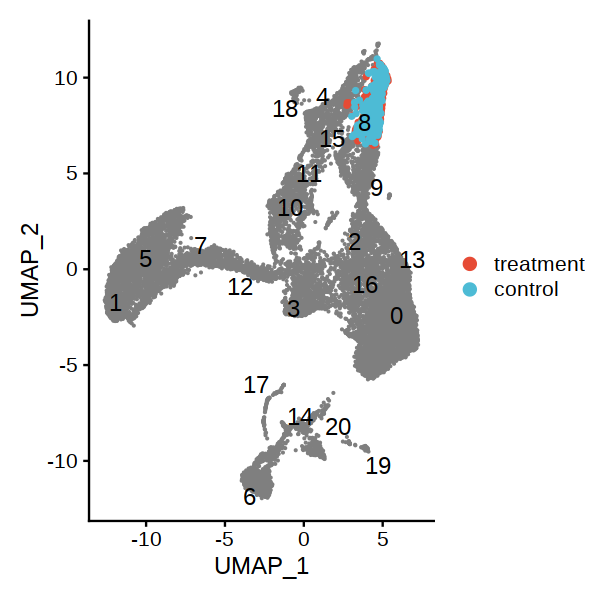

[1] "mWT"     "mNFIXko"
[1] "11"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



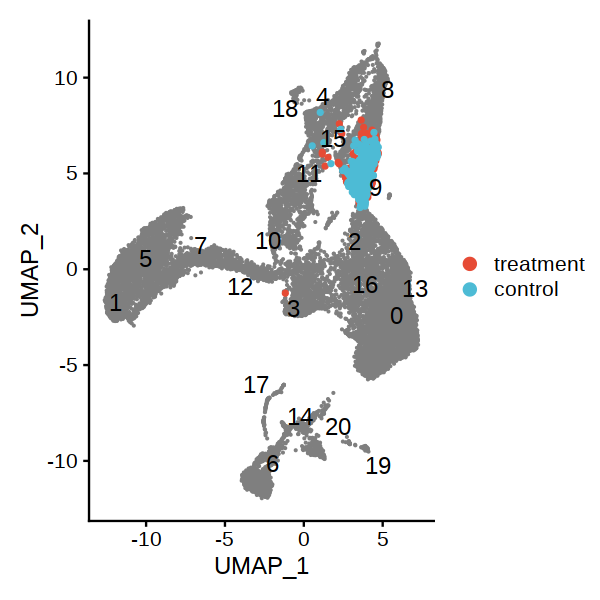

[1] "mWT"     "mNFIXko"
[1] "12"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



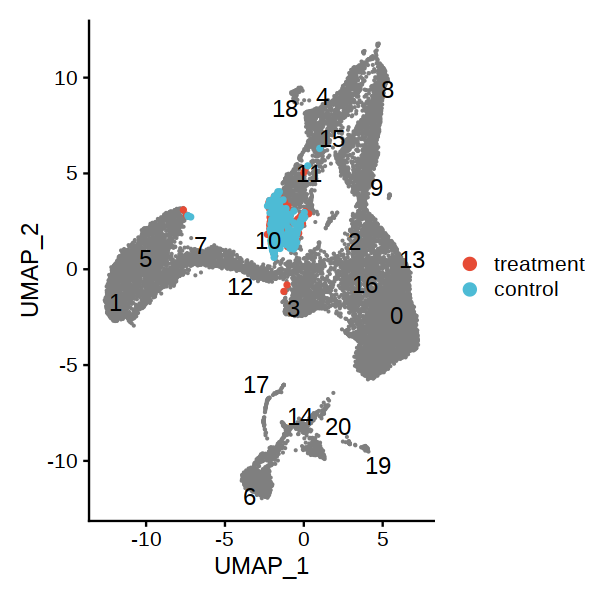

[1] "mWT"     "mNFIXko"
[1] "13"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



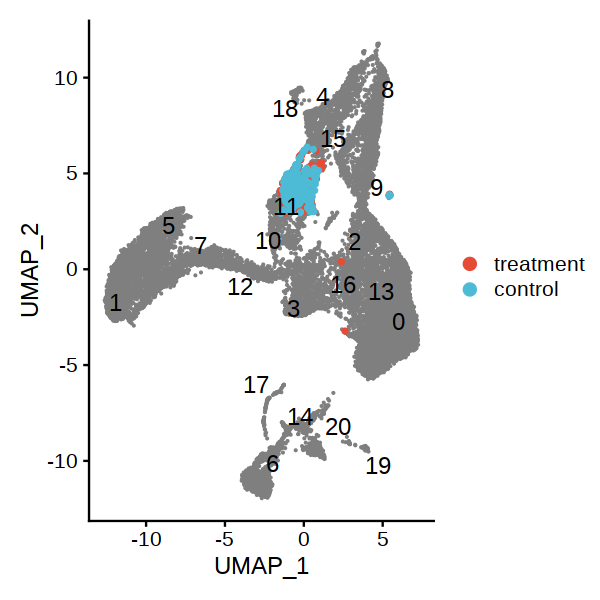

[1] "mWT"     "mNFIXko"
[1] "14"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



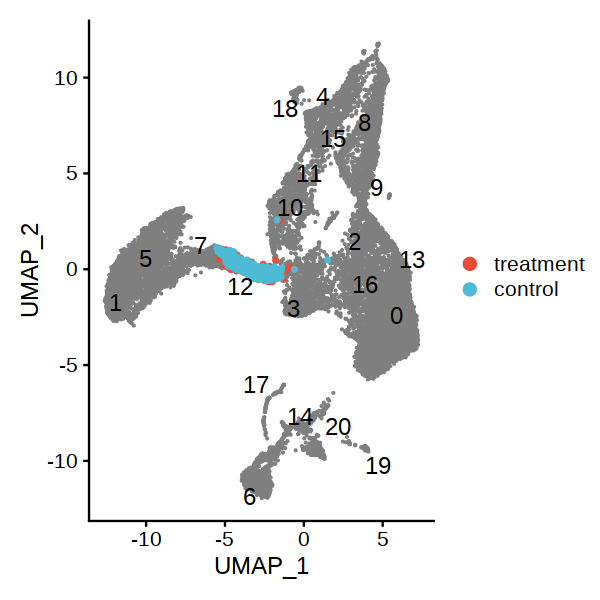

[1] "mWT"     "mNFIXko"
[1] "15"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



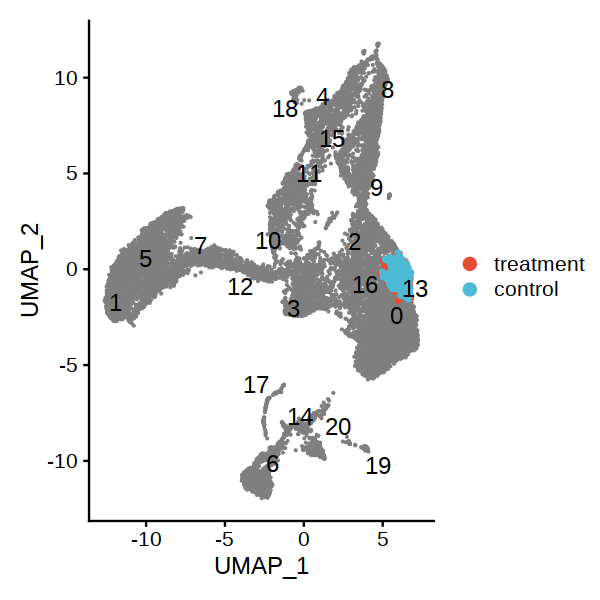

[1] "mWT"     "mNFIXko"
[1] "16"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



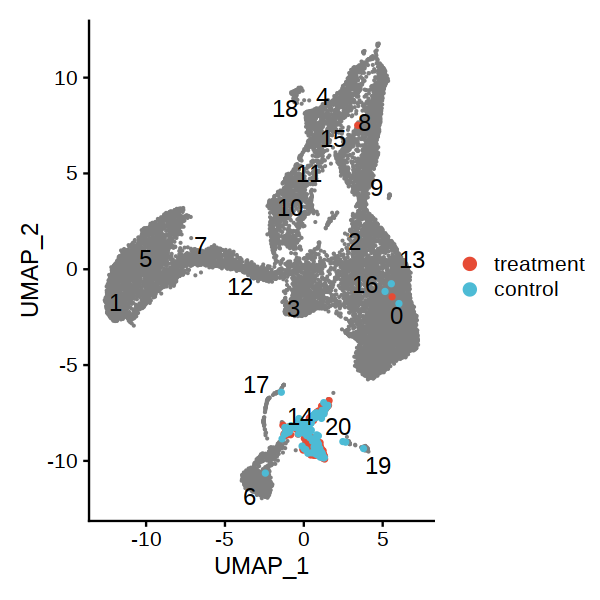

[1] "mWT"     "mNFIXko"
[1] "17"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



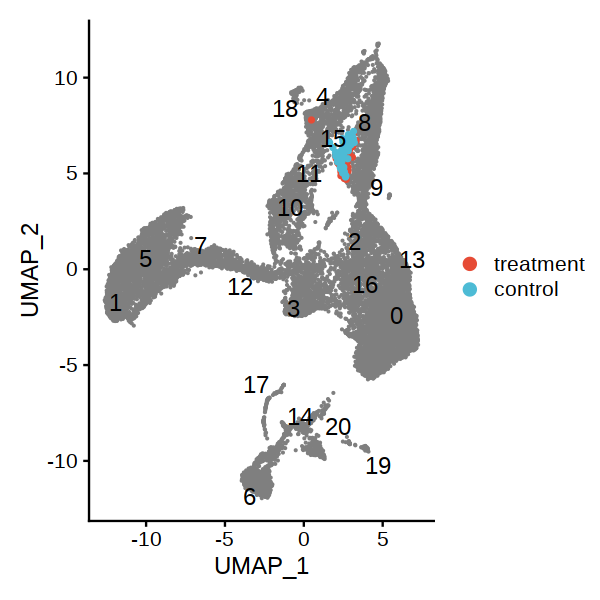

[1] "mWT"     "mNFIXko"
[1] "18"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



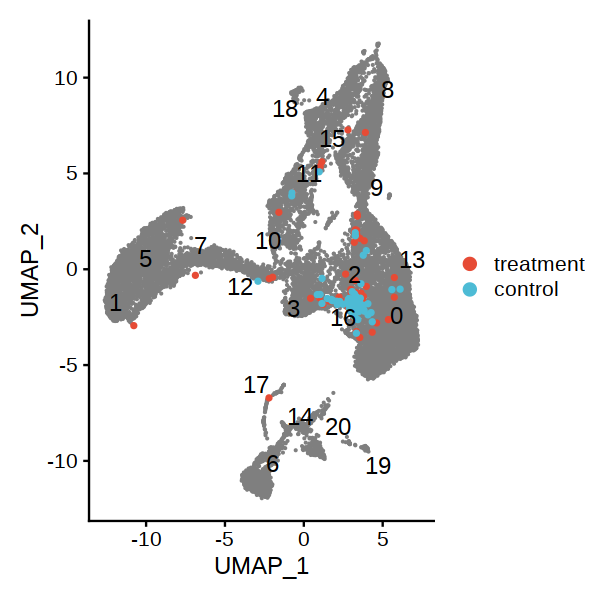

[1] "mWT"     "mNFIXko"
[1] "19"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



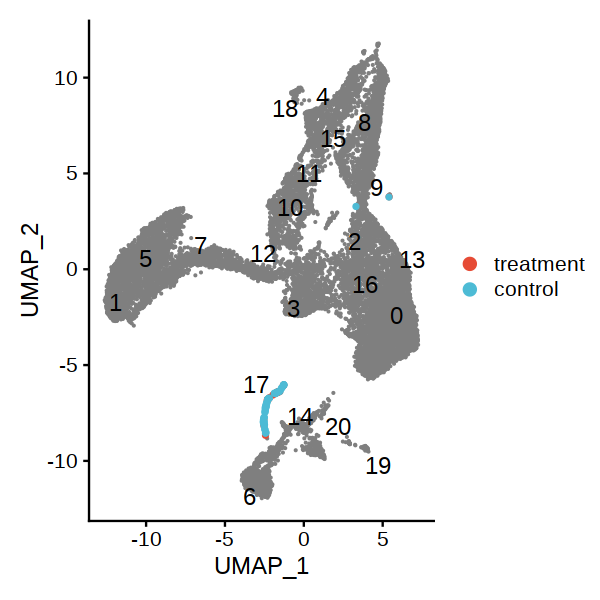

[1] "mWT"     "mNFIXko"
[1] "20"


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



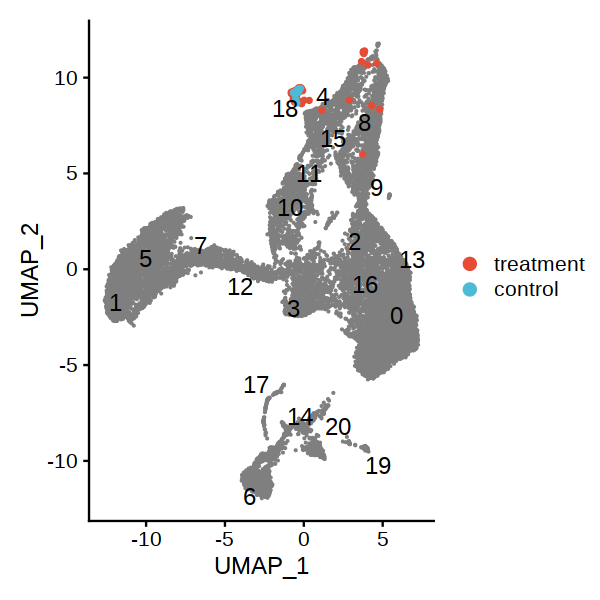

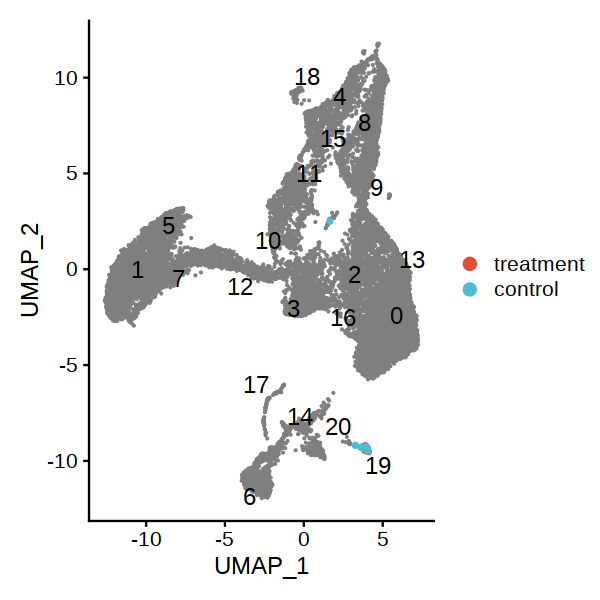

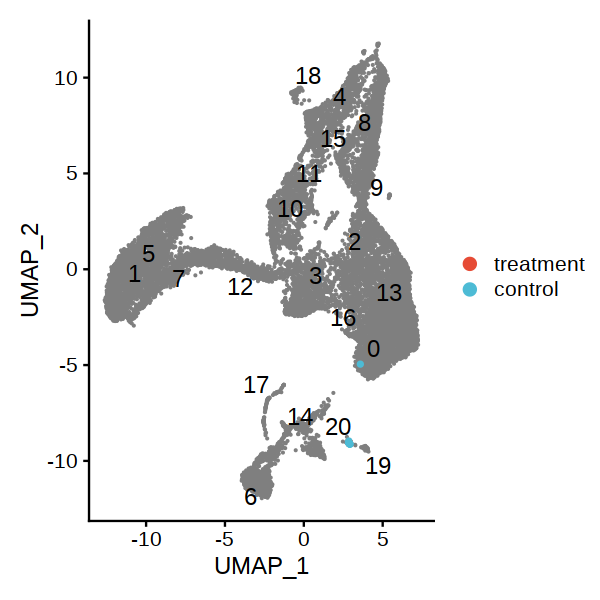

In [50]:
options(repr.plot.width = 5, repr.plot.height = 5)

pairwise_DEG = function(merged_obj,treatment,control,outDir){

for (c in levels(merged_obj)){
    tmp = subset(x = merged_obj, subset = seurat_clusters == c)
    degs = data.frame()
    tryCatch({
        print (unique(tmp$orig.ident))
        degs = FindMarkers(tmp, verbose=T,slot="data",ident.1 = treatment, ident.2 = control,group.by="orig.ident",logfc.threshold = 0.2,test.used="wilcox",pseudocount.use=1)                
    },error=function(cond){
        # message(cond)
        return (NA)
    },warning=function(cond){
        # message(cond)
        return (NA)
    },finally={
         
    }
    )
    # print (dim(degs))
    if (dim(degs)[1]==0){
        next
    }
    print (c)
    degs['fdr'] = p.adjust(degs$p_val, "BH")
    
    
    degs = degs[degs$fdr<=0.05,]
    custom_write_table2(degs,outDir,paste0("Cluster",c,".DEG.tsv"),sep="\t",row.names=T)
    if (dim(degs)[1]==0){next}
    # UMAP plot
    wt1 = WhichCells(merged_obj, expression = orig.ident == control & seurat_clusters==c)
    ko1 = WhichCells(merged_obj, expression = orig.ident == treatment & seurat_clusters==c)

    a=DimPlot(merged_obj,reduction = 'umap', label=T, cells.highlight= list(treatment=ko1, control=wt1), 
        cols.highlight = list("#E64B35","#4DBBD5"), cols= "grey100",repel = T, label.size = 5)+
        scale_colour_manual(values = c(treatment="#E64B35",control="#4DBBD5"))
    custom_ggsave2(a,outDir,paste0("Cluster",c,".UMAP.orig.ident.pdf"),10,10)
    print (a)
    # Vlnplot
    degs = head(degs,n=50)
    a=VlnPlot(tmp, features = rownames(degs),group.by="orig.ident",ncol=4,cols=c(treatment="#E64B35",control="#4DBBD5"))+ NoLegend()
    custom_ggsave2(a,outDir,paste0("Cluster",c,".Vln.orig.ident.pdf"),10,as.integer(length(degs)/4+1)*20)
    # print (a)
}    
    
}
pairwise_DEG(immune.combined.sct,"mWT","mNFIXko","./")

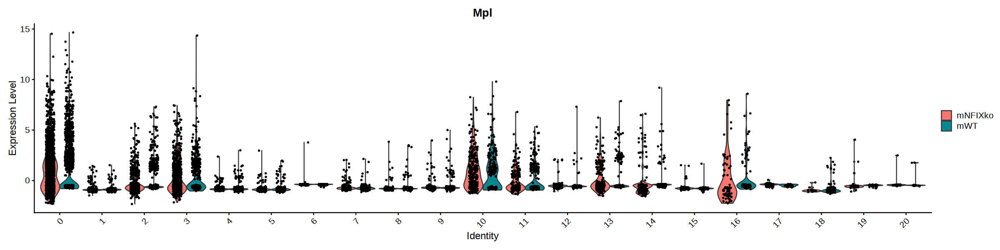

In [51]:
options(repr.plot.width = 20, repr.plot.height = 5)

VlnPlot(immune.combined.sct, features = "Mpl",split.by="orig.ident",slot="data")

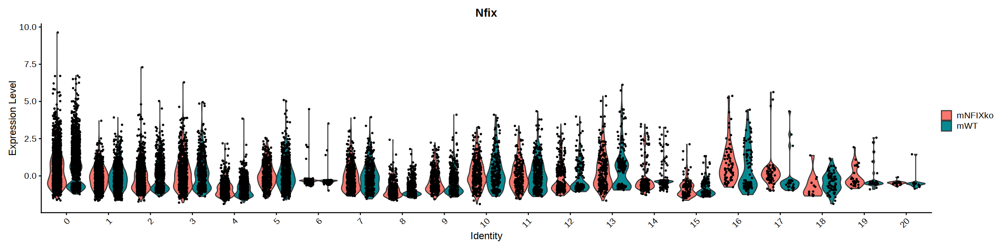

In [52]:
options(repr.plot.width = 20, repr.plot.height = 5)

VlnPlot(immune.combined.sct, features = "Nfix",split.by="orig.ident",slot="data")

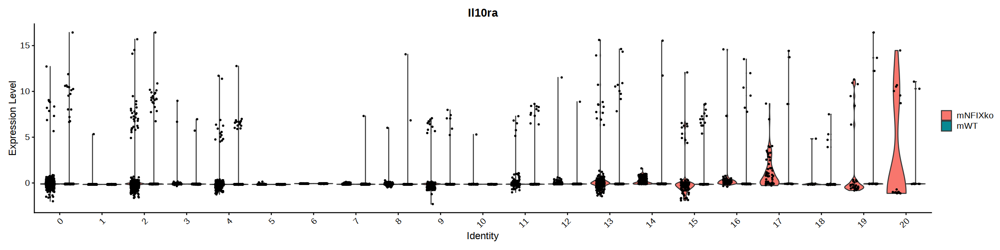

In [53]:
options(repr.plot.width = 20, repr.plot.height = 5)

VlnPlot(immune.combined.sct, features = "Il10ra",split.by="orig.ident",slot="data")

Warning message:
"Could not find Pdcd1 in the default search locations, found in RNA assay instead"


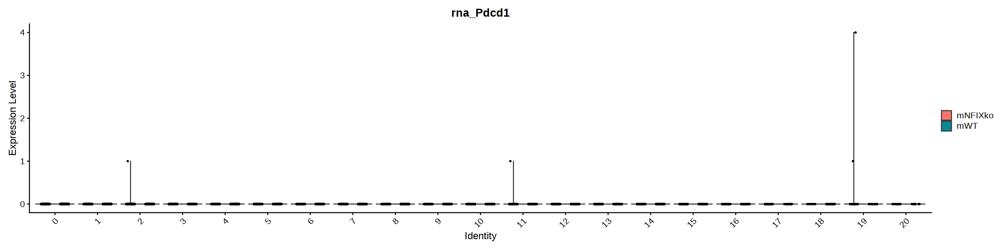

In [54]:
options(repr.plot.width = 20, repr.plot.height = 5)

VlnPlot(immune.combined.sct, features = "Pdcd1",split.by="orig.ident",slot="data")

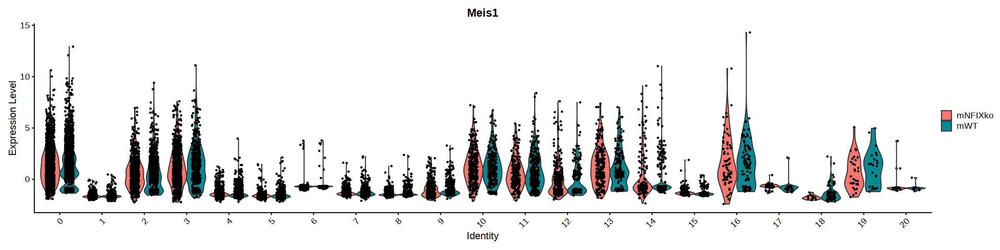

In [55]:
options(repr.plot.width = 20, repr.plot.height = 5)

VlnPlot(immune.combined.sct, features = "Meis1",split.by="orig.ident",slot="data")

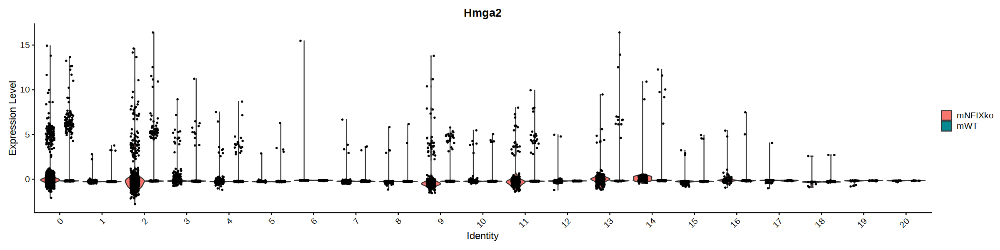

In [56]:
options(repr.plot.width = 20, repr.plot.height = 5)

VlnPlot(immune.combined.sct, features = "Hmga2",split.by="orig.ident",slot="data")

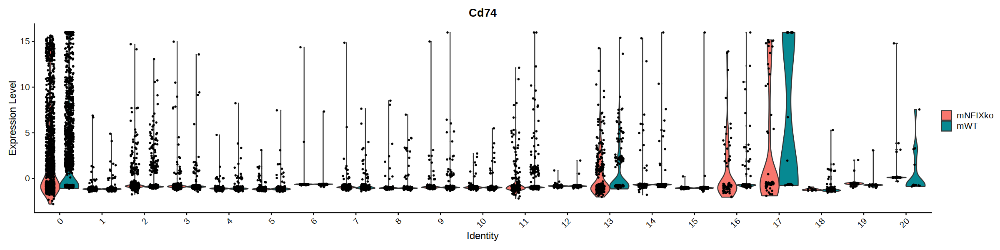

In [57]:
options(repr.plot.width = 20, repr.plot.height = 5)

VlnPlot(immune.combined.sct, features = "Cd74",split.by="orig.ident",slot="data")

In [ ]:
options(repr.plot.width = 20, repr.plot.height = 5)

VlnPlot(immune.combined.sct, features = "Cd74",split.by="orig.ident",slot="data")